In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import seaborn as sns
import itertools

In [14]:
housing = pd.read_csv('housing.csv')

In [15]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [16]:
housing.shape

(20640, 10)

In [17]:
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [18]:
housing.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [19]:
housing.fillna(0, inplace=True)

In [20]:
housing.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [9]:
housing['ocean_proximity'].unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

# EDA

# Univariate

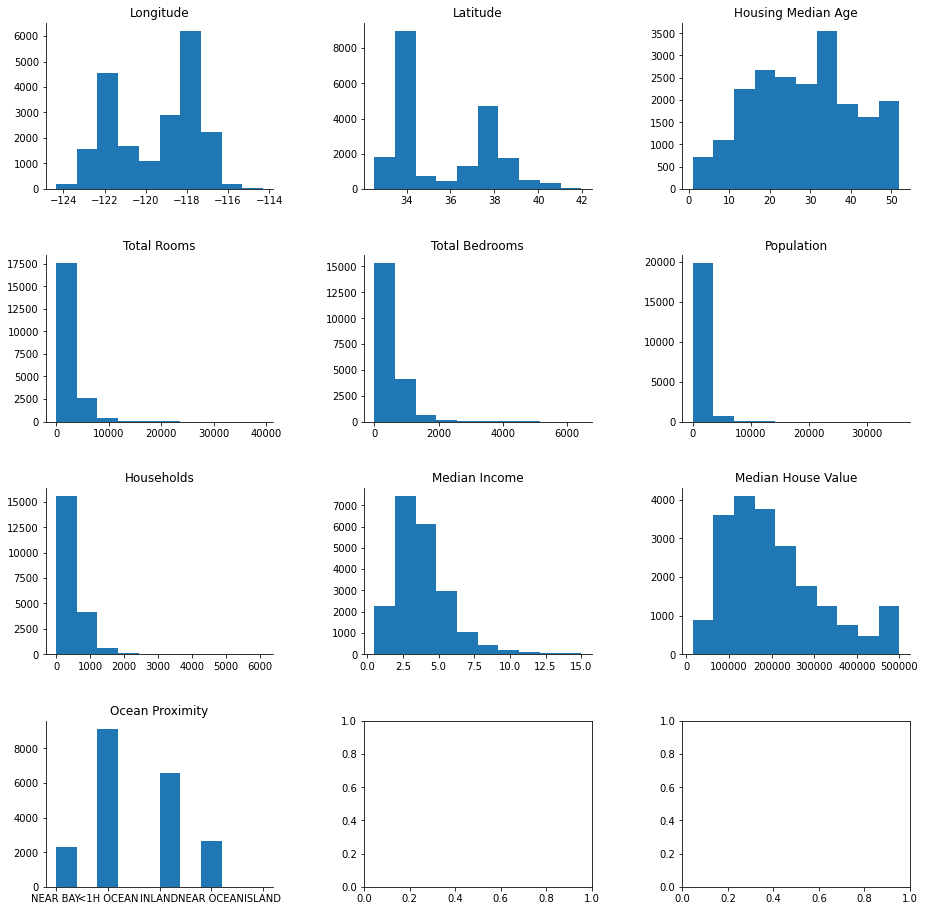

In [8]:
cols = housing.columns
fig, axes = plt.subplots(math.ceil(len(cols)/3), 3, figsize=(15,15))
axes = axes.flatten()
for col, n in zip(cols, range(len(axes))):
    axes[n].hist(housing[col])
    axes[n].set_title(str(col).replace("_", " ").title())

    right_side = axes[n].spines["right"]
    right_side.set_visible(False)
    top = axes[n].spines["top"]
    top.set_visible(False)
    
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()

# Bivariate

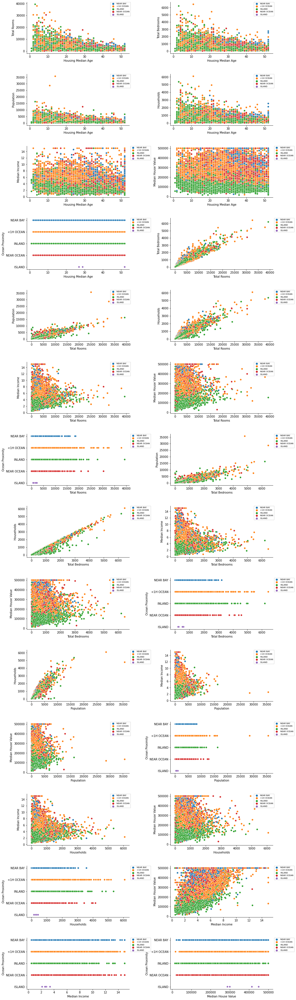

In [11]:
cols = housing.columns
cols = cols[2:]
colist = [i for i in itertools.combinations(cols, 2)]
fig, axes = plt.subplots(math.ceil(len(colist)/2), 2, figsize=(15,60))
axes = axes.flatten()

for feat, n in zip(colist, range(len(axes))):
    sns.scatterplot(data=housing, x=feat[0], y=feat[1], ax=axes[n], hue='ocean_proximity')
    axes[n].set_xlabel((str(feat[0]).title()).replace('_', ' '))
    axes[n].set_ylabel((str(feat[1]).title()).replace('_', ' '))
    axes[n].legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, fontsize='x-small')                   
    sns.despine();
    
    
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

plt.show()

<AxesSubplot:>

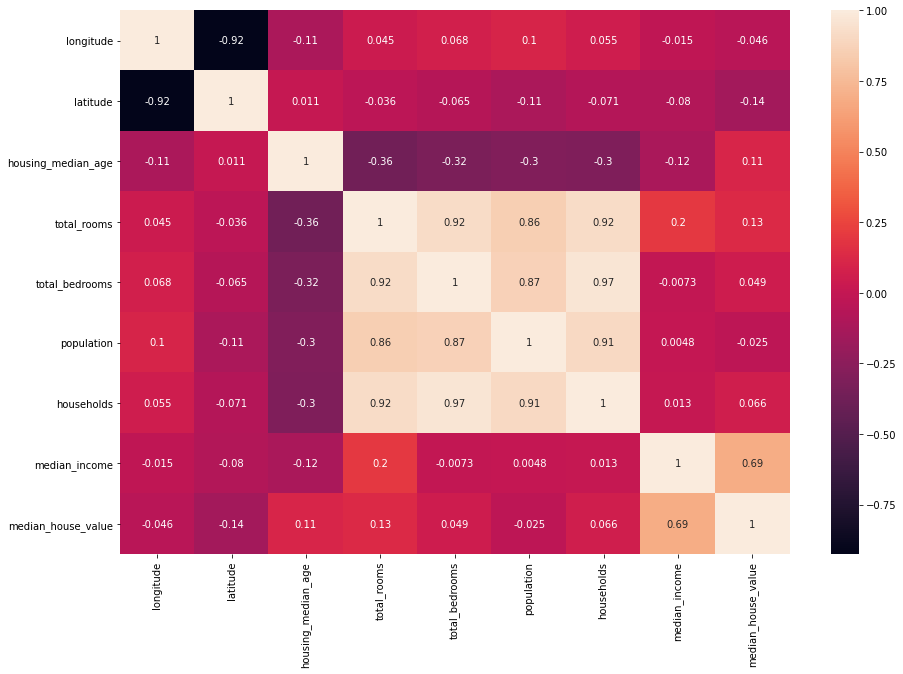

In [27]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(housing.corr(), annot=True)

# Geospatial Analysis

In [14]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

# Create a base map
m1 = folium.Map(
    location=[housing['latitude'].mean(), 
              housing['longitude'].mean()], 
    zoom_start=5,
    titles="Stamen Terrain")

# Circle marker
for lat, long in zip(housing['latitude'], housing['longitude']):
    Circle([lat, long],radius=1).add_to(m1)

# Display the map
m1

# Feature Engineering

In [22]:
housing['bedrooms per rooms'] = housing['total_bedrooms']/housing['total_rooms']
housing['bedrooms per population'] = housing['total_bedrooms']/housing['population']
housing['rooms per population'] = housing['total_rooms']/housing['population']
housing['population per households'] = housing['population']/housing['households']

In [23]:
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,bedrooms per rooms,bedrooms per population,rooms per population,population per households
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,0.146591,0.400621,2.732919,2.555556
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,0.155797,0.460641,2.956685,2.109842
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,0.129516,0.383065,2.957661,2.802260
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,0.184458,0.421147,2.283154,2.547945
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,0.172096,0.495575,2.879646,2.181467


<AxesSubplot:>

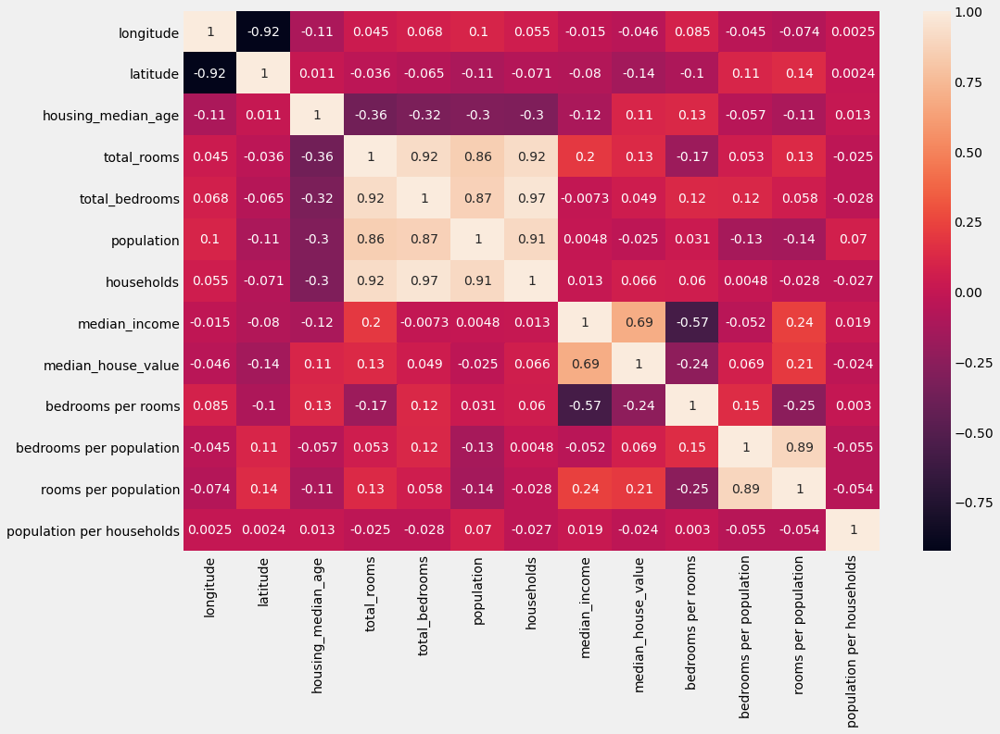

In [24]:
fig, axes = plt.subplots(figsize=(15,10))
sns.heatmap(housing.corr(), annot=True)

# One-Hot Encoding

In [27]:
OHE = pd.get_dummies(housing['ocean_proximity'])
housing[OHE.columns] = OHE

In [28]:
housing.drop('ocean_proximity', axis=1, inplace=True)

In [29]:
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,bedrooms per rooms,bedrooms per population,rooms per population,population per households,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0.146591,0.400621,2.732919,2.555556,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0.155797,0.460641,2.956685,2.109842,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0.129516,0.383065,2.957661,2.802260,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0.184458,0.421147,2.283154,2.547945,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0.172096,0.495575,2.879646,2.181467,0,0,0,1,0


In [30]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(housing, test_size=0.2, random_state=42, shuffle=True)

In [31]:
train.shape, test.shape

((16512, 18), (4128, 18))

In [32]:
train.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,bedrooms per rooms,bedrooms per population,rooms per population,population per households,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
14196,-117.03,32.71,33.0,3126.0,627.0,2300.0,623.0,3.2596,103000.0,0.200576,0.272609,1.359130,3.691814,0,0,0,0,1
8267,-118.16,33.77,49.0,3382.0,787.0,1314.0,756.0,3.8125,382100.0,0.232703,0.598935,2.573820,1.738095,0,0,0,0,1
17445,-120.48,34.66,4.0,1897.0,331.0,915.0,336.0,4.1563,172600.0,0.174486,0.361749,2.073224,2.723214,0,0,0,0,1
14265,-117.11,32.69,36.0,1421.0,367.0,1418.0,355.0,1.9425,93400.0,0.258269,0.258815,1.002116,3.994366,0,0,0,0,1
2271,-119.80,36.78,43.0,2382.0,431.0,874.0,380.0,3.5542,96500.0,0.180940,0.493135,2.725400,2.300000,0,1,0,0,0


In [44]:
X_train = train.drop('median_house_value', axis=1)
X_test = test.drop('median_house_value', axis=1)

y_train = train[['median_house_value']]
y_test = test[['median_house_value']]

In [45]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [46]:
import torch.nn as nn
import torch

In [47]:
X_train = torch.tensor(X_train.astype(np.float32))
y_train = torch.tensor(y_train.astype(np.float32))
X_test = torch.tensor(X_test.astype(np.float32))
y_test = torch.tensor(y_test.astype(np.float32))

In [56]:
# Build the model
model = nn.Sequential(
    nn.Linear(X_train.shape[1], 128),
    nn.BatchNorm1d(128),
    nn.ReLU(),
    nn.Linear(128, 90),
    nn.ReLU(),
    nn.Linear(90, 50),
    nn.ReLU(),
    nn.Linear(50, 1)
)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [57]:
from torch.autograd import Variable

In [50]:
# Train the model
def full_gd(model, criterion, optimizer, X_train, y_train, X_test, y_test, epochs=1000, verbosity=1):
    # Stuff to store
    train_losses = np.zeros(epochs)
    test_losses = np.zeros(epochs)
    
    for it in range(epochs):
        # zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        X_train = Variable(X_train)
        y_train = Variable(y_train)
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
      
        # Backward and optimize
        loss.backward()
        optimizer.step()

        # Save losses
        train_losses[it] = loss.item()

        # Forward pass
        X_test = Variable(X_test)
        y_test = Variable(y_test)
        test_outputs = model(X_test)
        test_loss = criterion(test_outputs, y_test)

        # Save losses
        test_losses[it] = test_loss.item()
        
        if verbosity == 1:
            if (it + 1) % 50 == 0:
                print(f'Epoch {it+1}/{epochs}, Train Loss: {loss.item():.4f}, Test Loss: {test_loss.item():.4f}')
  
    return train_losses, test_losses

In [58]:
train_losses, test_losses = full_gd(model, criterion, optimizer, X_train, y_train, X_test, y_test, epochs=1000, verbosity=0)

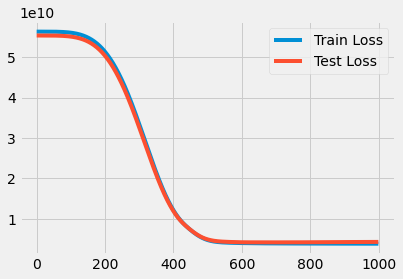

In [59]:
plt.plot(train_losses)
plt.plot(test_losses)
plt.legend(['Train Loss', 'Test Loss'])

In [62]:
train_losses[-1]

3851014912.0

In [63]:
test_losses[-1]

4291109888.0

In [65]:
housing.shape

(20640, 18)

In [ ]:
#3 input -> bn -> 53 -> 90 -> 130 -> 1          4447396864
#3 input -> bn -> 90 -> 90 -> 90 -> 90 -> 1     4428604416
#3 128 -> bn -> 100 -> 100 -> 100 -> 100 -> 1   4432589824
#3 128 -> bn -> -> do0.1 -> 90 -> bn -> 50 -> 1 4342590976
#3 128 -> bn -> -> do0.1 -> 90 -> bn -> 50 -> 1 4462257664
#3 128 -> bn -> -> do0.2 -> 90 -> bn -> 50 -> 1 4556926464
#3 128 -> bn -> -> do0.5 -> 90 -> bn -> 50 -> 1 5081755136
#3 128 -> bn -> 90 -> bn -> 50 -> 1             43775377408
#3 128 -> bn -> 90 -> 50 -> 1                   4330264576